In [1]:
# Install necessary packages
!pip install geemap rasterio geopandas

# Imports

In [2]:
# Import libraries
import geemap
import rasterio
import geopandas as gpd
from rasterio.plot import show

# Setting Earch Engine

In [3]:
!earthengine authenticate

Authenticate: Limited support in Colab. Use ee.Authenticate() or --auth_mode=notebook instead.
W0921 20:14:23.290483 133979474866176 _default.py:683] No project ID could be determined. Consider running `gcloud config set project` or setting the GOOGLE_CLOUD_PROJECT environment variable
To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://code.earthengine.google.com/client-auth?scopes=https%3A//www.googleapis.com/auth/earthengine%20https%3A//www.googleapis.com/auth/cloud-platform%20https%3A//www.googleapis.com/auth/devstorage.full_control&request_id=6xv-mOPXayJTO5mZvx1_Wy6Ikel_by3eoU3Auz0s_cs&tc=WQH8H5ZDSO97FcH-icLdT5Bt7g94F7a0AkrpceWtu6U&cc=Hea0sKsJsNKqtkvg2Mn0Bkm1-ddgu33VAJEcl8o8Wjw

The authorization workflow will generate a code, which you should paste in the box below.
Enter verification code: 4/1AQlEd8yy20MiF73tRXlelOE1G-zP

In [4]:
# Initialize Google Earth Engine
import ee
import geemap

ee.Initialize()


# Create Dataset For Training

In [5]:
aoi_size = 0.02  # Size of the AOI in degrees (0.02 degrees on each side)

aoi_list = [
    # Existing cities
    ee.Geometry.Polygon([[
        [3.058 - aoi_size / 2, 36.753 + aoi_size / 2],  # Algiers
        [3.058 - aoi_size / 2, 36.753 - aoi_size / 2],
        [3.058 + aoi_size / 2, 36.753 - aoi_size / 2],
        [3.058 + aoi_size / 2, 36.753 + aoi_size / 2],
    ]]),
    ee.Geometry.Polygon([[
        [0.628 - aoi_size / 2, 35.693 + aoi_size / 2],  # Oran
        [0.628 - aoi_size / 2, 35.693 - aoi_size / 2],
        [0.628 + aoi_size / 2, 35.693 - aoi_size / 2],
        [0.628 + aoi_size / 2, 35.693 + aoi_size / 2],
    ]]),
    ee.Geometry.Polygon([[
        [7.755 - aoi_size / 2, 36.900 + aoi_size / 2],  # Annaba
        [7.755 - aoi_size / 2, 36.900 - aoi_size / 2],
        [7.755 + aoi_size / 2, 36.900 - aoi_size / 2],
        [7.755 + aoi_size / 2, 36.900 + aoi_size / 2],
    ]]),
    ee.Geometry.Polygon([[
        [6.610 - aoi_size / 2, 36.365 + aoi_size / 2],  # Constantine
        [6.610 - aoi_size / 2, 36.365 - aoi_size / 2],
        [6.610 + aoi_size / 2, 36.365 - aoi_size / 2],
        [6.610 + aoi_size / 2, 36.365 + aoi_size / 2],
    ]]),
    ee.Geometry.Polygon([[
        [3.999 - aoi_size / 2, 32.487 + aoi_size / 2],  # Ghardaïa
        [3.999 - aoi_size / 2, 32.487 - aoi_size / 2],
        [3.999 + aoi_size / 2, 32.487 - aoi_size / 2],
        [3.999 + aoi_size / 2, 32.487 + aoi_size / 2],
    ]]),
    ee.Geometry.Polygon([[
        [5.080 - aoi_size / 2, 36.752 + aoi_size / 2],  # Bejaia
        [5.080 - aoi_size / 2, 36.752 - aoi_size / 2],
        [5.080 + aoi_size / 2, 36.752 - aoi_size / 2],
        [5.080 + aoi_size / 2, 36.752 + aoi_size / 2],
    ]]),
    ee.Geometry.Polygon([[
        [1.318 - aoi_size / 2, 34.885 + aoi_size / 2],  # Tlemcen
        [1.318 - aoi_size / 2, 34.885 - aoi_size / 2],
        [1.318 + aoi_size / 2, 34.885 - aoi_size / 2],
        [1.318 + aoi_size / 2, 34.885 + aoi_size / 2],
    ]]),

    # Additional cities
    ee.Geometry.Polygon([[
        [2.745 - aoi_size / 2, 34.861 + aoi_size / 2],  # Djelfa
        [2.745 - aoi_size / 2, 34.861 - aoi_size / 2],
        [2.745 + aoi_size / 2, 34.861 - aoi_size / 2],
        [2.745 + aoi_size / 2, 34.861 + aoi_size / 2],
    ]]),
    ee.Geometry.Polygon([[
        [1.308 - aoi_size / 2, 36.172 + aoi_size / 2],  # Blida
        [1.308 - aoi_size / 2, 36.172 - aoi_size / 2],
        [1.308 + aoi_size / 2, 36.172 - aoi_size / 2],
        [1.308 + aoi_size / 2, 36.172 + aoi_size / 2],
    ]]),
    ee.Geometry.Polygon([[
        [0.180 - aoi_size / 2, 35.899 + aoi_size / 2],  # Mostaganem
        [0.180 - aoi_size / 2, 35.899 - aoi_size / 2],
        [0.180 + aoi_size / 2, 35.899 - aoi_size / 2],
        [0.180 + aoi_size / 2, 35.899 + aoi_size / 2],
    ]]),
    ee.Geometry.Polygon([[
        [5.670 - aoi_size / 2, 35.705 + aoi_size / 2],  # Jijel
        [5.670 - aoi_size / 2, 35.705 - aoi_size / 2],
        [5.670 + aoi_size / 2, 35.705 - aoi_size / 2],
        [5.670 + aoi_size / 2, 35.705 + aoi_size / 2],
    ]]),
    ee.Geometry.Polygon([[
        [4.220 - aoi_size / 2, 36.367 + aoi_size / 2],  # Bouira
        [4.220 - aoi_size / 2, 36.367 - aoi_size / 2],
        [4.220 + aoi_size / 2, 36.367 - aoi_size / 2],
        [4.220 + aoi_size / 2, 36.367 + aoi_size / 2],
    ]]),
    ee.Geometry.Polygon([[
        [6.290 - aoi_size / 2, 33.534 + aoi_size / 2],  # Biskra
        [6.290 - aoi_size / 2, 33.534 - aoi_size / 2],
        [6.290 + aoi_size / 2, 33.534 - aoi_size / 2],
        [6.290 + aoi_size / 2, 33.534 + aoi_size / 2],
    ]]),
    ee.Geometry.Polygon([[
        [7.269 - aoi_size / 2, 34.881 + aoi_size / 2],  # El Oued
        [7.269 - aoi_size / 2, 34.881 - aoi_size / 2],
        [7.269 + aoi_size / 2, 34.881 - aoi_size / 2],
        [7.269 + aoi_size / 2, 34.881 + aoi_size / 2],
    ]]),
    ee.Geometry.Polygon([[
        [0.453 - aoi_size / 2, 32.463 + aoi_size / 2],  # Adrar
        [0.453 - aoi_size / 2, 32.463 - aoi_size / 2],
        [0.453 + aoi_size / 2, 32.463 - aoi_size / 2],
        [0.453 + aoi_size / 2, 32.463 + aoi_size / 2],
    ]]),
    ee.Geometry.Polygon([[
        [5.264 - aoi_size / 2, 30.564 + aoi_size / 2],  # Tamanrasset
        [5.264 - aoi_size / 2, 30.564 - aoi_size / 2],
        [5.264 + aoi_size / 2, 30.564 - aoi_size / 2],
        [5.264 + aoi_size / 2, 30.564 + aoi_size / 2],
    ]]),
    ee.Geometry.Polygon([[
        [2.884 - aoi_size / 2, 36.479 + aoi_size / 2],  # Tipaza
        [2.884 - aoi_size / 2, 36.479 - aoi_size / 2],
        [2.884 + aoi_size / 2, 36.479 - aoi_size / 2],
        [2.884 + aoi_size / 2, 36.479 + aoi_size / 2],
    ]])
]


In [6]:


# Check the first AOI
aoi_list[0]


ee.Geometry({
  "functionInvocationValue": {
    "functionName": "GeometryConstructors.Polygon",
    "arguments": {
      "coordinates": {
        "constantValue": [
          [
            [
              3.048,
              36.763
            ],
            [
              3.048,
              36.743
            ],
            [
              3.0679999999999996,
              36.743
            ],
            [
              3.0679999999999996,
              36.763
            ]
          ]
        ]
      },
      "evenOdd": {
        "constantValue": true
      }
    }
  }
})

In [7]:
# Initialize the map
Map = geemap.Map(center=[28.0, 4.0], zoom=5)



# Add all AOIs to the map
for i, aoi in enumerate(aoi_list):
    Map.addLayer(aoi, {'color': 'red'}, f'AOI {i+1}')  # Add each AOI with a unique name
    sentinel = ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED') \
        .filterDate('2022-09-20', '2023-09-21') \
        .select(['B2', 'B3', 'B4', 'B8', 'B11', 'B12']) \
        .filterBounds(aoi)

    # Get the median image from the collection
    satellite_image = sentinel.median().clip(aoi)

    # Rename bands for better readability
    sentinel2_image = satellite_image.rename(['Blue', 'Green', 'Red', 'NIR', 'SWIR1', 'SWIR2'])


    # Add the Sentinel-2 RGB layer to the map
    Map.addLayer(sentinel2_image, {'bands': ['Red', 'Green', 'Blue'], 'min': 0, 'max': 3000}, f'sentinel {i+1}')

# Display the map
Map.addLayerControl()  # Optional layer control
Map

Map(center=[28.0, 4.0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(c…

## Extract Data From ESA Dataset

In [9]:
# Define the ESA WorldCover dataset
worldcover = ee.ImageCollection('ESA/WorldCover/v100').filter(ee.Filter.eq('system:index', '2020'))

# Iterate through each region and clip the WorldCover dataset
for i, aoi in enumerate(aoi_list):
    world_cover = worldcover.first().eq(10).clip(aoi)

    # Export each clipped image to Google Drive
    export_task = ee.batch.Export.image.toDrive(
        image=world_cover,
        description=f'WorldCover_Export_{i}',
        folder='EarthEngineImages/WorldCover_Forest_copy',
        scale=10,  # Resolution in meters (matches ESA WorldCover)
        region=aoi,
        fileFormat='GeoTIFF'
    )
    export_task.start()


In [17]:
export_task.status()

{'state': 'COMPLETED',
 'description': 'WorldCover_Export_16',
 'priority': 100,
 'creation_timestamp_ms': 1726949747218,
 'update_timestamp_ms': 1726949810325,
 'start_timestamp_ms': 1726949800184,
 'task_type': 'EXPORT_IMAGE',
 'destination_uris': ['https://drive.google.com/#folders/1dq0LkmAfuQotb3X8ZH_VDv8uUtu0FT8D'],
 'attempt': 1,
 'batch_eecu_usage_seconds': 0.1250642091035843,
 'id': 'YU63UKW6ZIVXUYWU4Z3XSYL7',
 'name': 'projects/750546603249/operations/YU63UKW6ZIVXUYWU4Z3XSYL7'}

## Extract Data From Sentinel-2

In [11]:
# Define the Sentinel-2 image collection
sentinel = ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED') \
        .filterDate('2022-09-20', '2023-09-21') \
        .select(['B2', 'B3', 'B4', 'B8', 'B11', 'B12'])

# Iterate through each region and export the corresponding Sentinel-2 image
for i, aoi in enumerate(aoi_list):
    sentinel_image = sentinel.median().clip(aoi)  # Median composite to get a cloud-free image

    # Rename bands for better readability
    sentinel2_image = sentinel_image.rename(['Blue', 'Green', 'Red', 'NIR', 'SWIR1', 'SWIR2'])

    # Export the dataset to Google Drive
    task = ee.batch.Export.image.toDrive(**{
        'image': sentinel2_image,
        'folder': 'EarthEngineImages/Sentinel_Forest_copy',
        'description': f'SentinelTree_Export_{i}',
        'scale': 10,
        'region': aoi,
        'maxPixels': 1e13,
        'fileFormat': 'GeoTIFF'
    })
    task.start()


In [18]:
task.status()

{'state': 'COMPLETED',
 'description': 'SentinelTree_Export_16',
 'priority': 100,
 'creation_timestamp_ms': 1726949752317,
 'update_timestamp_ms': 1726949889455,
 'start_timestamp_ms': 1726949878063,
 'task_type': 'EXPORT_IMAGE',
 'destination_uris': ['https://drive.google.com/#folders/1o6_L1DcxzvZeCJjuVjI-9liU_DD6KX1S'],
 'attempt': 1,
 'batch_eecu_usage_seconds': 9.111567497253418,
 'id': 'HKFB4GDAN6KAK5C4PBTI5QEH',
 'name': 'projects/750546603249/operations/HKFB4GDAN6KAK5C4PBTI5QEH'}

# Loading Images

In [13]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [24]:

import os
import glob
import rasterio
import numpy as np

# Define the paths to your Sentinel-2 and WorldCover images
sentinel2_folder = '/content/drive/MyDrive/EarthEngineImages Sentinel_Forest_copy'
worldcover_folder = '/content/drive/MyDrive/EarthEngineImages WorldCover_Forest_copy'

# Get the first 20 images from each folder
sentinel2_files = sorted(glob.glob(os.path.join(sentinel2_folder, '*.tif')))[:16]
worldcover_files = sorted(glob.glob(os.path.join(worldcover_folder, '*.tif')))[:16]

print(len(sentinel2_files))
print(len(worldcover_files))

# Check if the lengths match
assert len(sentinel2_files) == len(worldcover_files) == 16, "Number of Sentinel-2 and WorldCover images must match."


16
16


In [25]:
s2_file = sentinel2_files[0]
wc_file = worldcover_files[0]

In [26]:
equal = True

for i, (s2_file, wc_file) in enumerate(zip(sentinel2_files, worldcover_files)):
    # Load Sentinel-2 image
    with rasterio.open(s2_file) as src:
        sentinel_image = src.read()  # Reads all bands

    # Load WorldCover image
    with rasterio.open(wc_file) as src:
        worldcover_image = src.read(1)  # Read the first band (classification labels)

    # Check if the shapes are the same
    if sentinel_image.shape[1:] != worldcover_image.shape:  # Compare height and width
        equal = False
        print(f"Mismatch in image {i + 1}:")
        print(f"Sentinel-2 Image: {s2_file}, Shape: {sentinel_image.shape}")
        print(f"WorldCover Image: {wc_file}, Shape: {worldcover_image.shape}")
        print("-" * 50)

# Final message if all are equal
if equal:
    print("All images have equal shapes.")


Mismatch in image 1:
Sentinel-2 Image: /content/drive/MyDrive/EarthEngineImages Sentinel_Forest_copy/SentinelTree_Export_1.tif, Shape: (6, 223, 224)
WorldCover Image: /content/drive/MyDrive/EarthEngineImages WorldCover_Forest_copy/WorldCover_Export_0.tif, Shape: (224, 223)
--------------------------------------------------
Mismatch in image 4:
Sentinel-2 Image: /content/drive/MyDrive/EarthEngineImages Sentinel_Forest_copy/SentinelTree_Export_12.tif, Shape: (6, 224, 224)
WorldCover Image: /content/drive/MyDrive/EarthEngineImages WorldCover_Forest_copy/WorldCover_Export_11.tif, Shape: (224, 223)
--------------------------------------------------
Mismatch in image 5:
Sentinel-2 Image: /content/drive/MyDrive/EarthEngineImages Sentinel_Forest_copy/SentinelTree_Export_13.tif, Shape: (6, 223, 224)
WorldCover Image: /content/drive/MyDrive/EarthEngineImages WorldCover_Forest_copy/WorldCover_Export_12.tif, Shape: (224, 224)
--------------------------------------------------
Mismatch in image 6:


In [27]:
import matplotlib.pyplot as plt

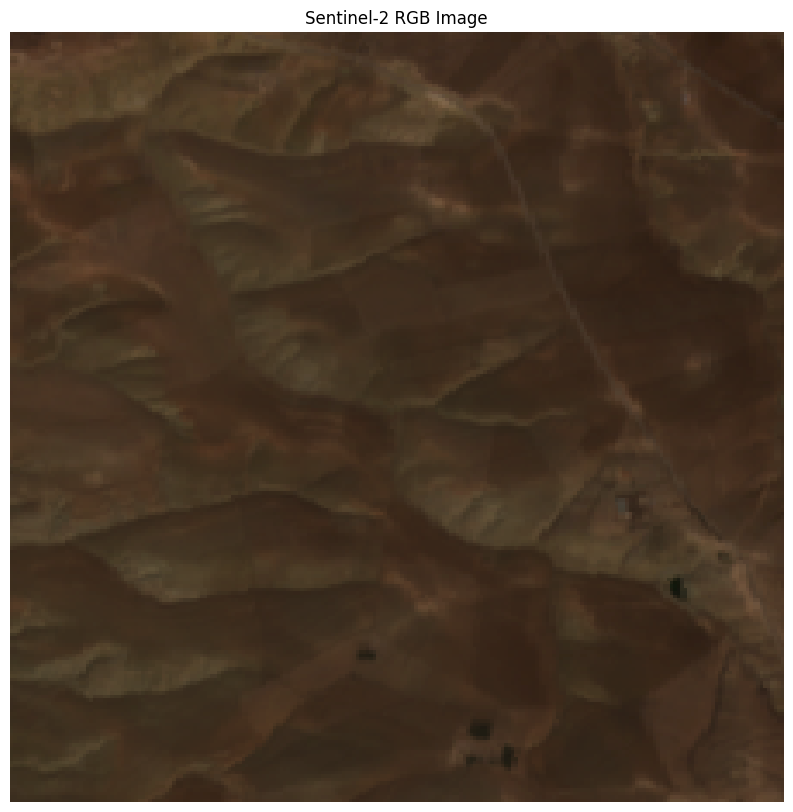

In [28]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

def plot_tiff_image(tiff_file):
    # Open the GeoTIFF image using rasterio
    with rasterio.open(tiff_file) as src:
        # Read the Blue (B2), Green (B3), and Red (B4) bands for RGB visualization
        red = src.read(3)  # B4 is the third band
        green = src.read(2)  # B3 is the second band
        blue = src.read(1)  # B2 is the first band

        # Stack the RGB bands into a 3D array (height, width, 3)
        rgb_image = np.stack((red, green, blue), axis=-1)

    # Normalize the pixel values (optional, based on Sentinel-2 scale of 0 to 10000)
    rgb_image = rgb_image / 10000.0  # Divide by 10000 to bring pixel values between 0 and 1

    # Plot the image using matplotlib
    plt.figure(figsize=(10, 10))
    plt.imshow(rgb_image)
    plt.title('Sentinel-2 RGB Image')
    plt.axis('off')  # Turn off the axis
    plt.show()

# Example usage
tiff_file =  sentinel2_files[0]   # Replace with the actual GeoTIFF path
plot_tiff_image(tiff_file)


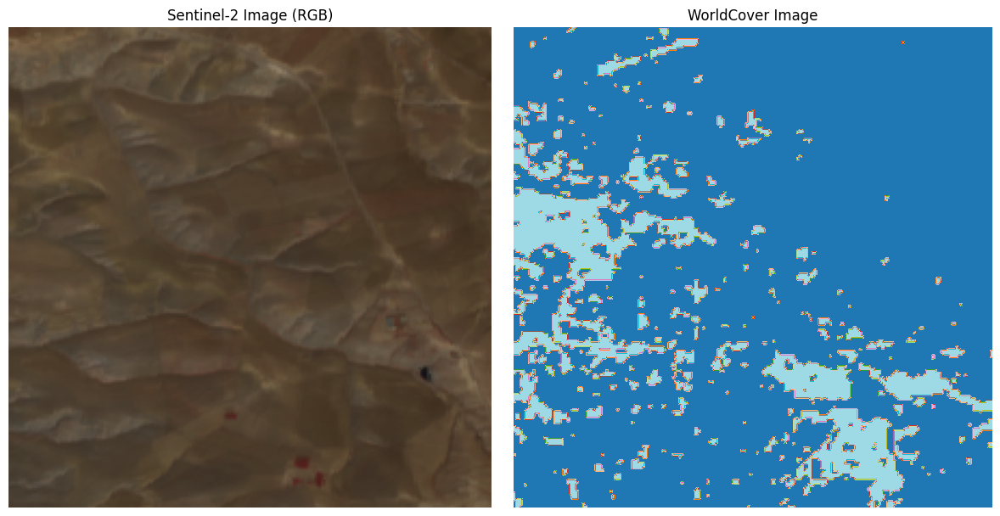

In [29]:
import matplotlib.pyplot as plt
import rasterio

def visualize_images(s2_file, wc_file):
    # Load Sentinel-2 image
    with rasterio.open(s2_file) as src:
        sentinel_image = src.read([4, 3, 2])  # Reading Red, Green, Blue bands for RGB visualization
        sentinel_meta = src.meta

    # Load WorldCover image
    with rasterio.open(wc_file) as src:
        worldcover_image = src.read(1)  # Read the first band (classification labels)

    # Normalize the Sentinel-2 image
    sentinel_image = sentinel_image.astype('float32') / 10000  # Rescale values for visualization

    # Plot Sentinel-2 Image (RGB)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(sentinel_image.transpose((1, 2, 0)))  # Correct the shape for display
    plt.title('Sentinel-2 Image (RGB)')
    plt.axis('off')

    # Plot WorldCover Image
    plt.subplot(1, 2, 2)
    plt.imshow(worldcover_image, cmap='tab20')  # Use colormap to represent categories
    plt.title('WorldCover Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Example usage (ensure you have proper file paths)
visualize_images(s2_file=sentinel2_files[0], wc_file=worldcover_files[0])


Image 1:


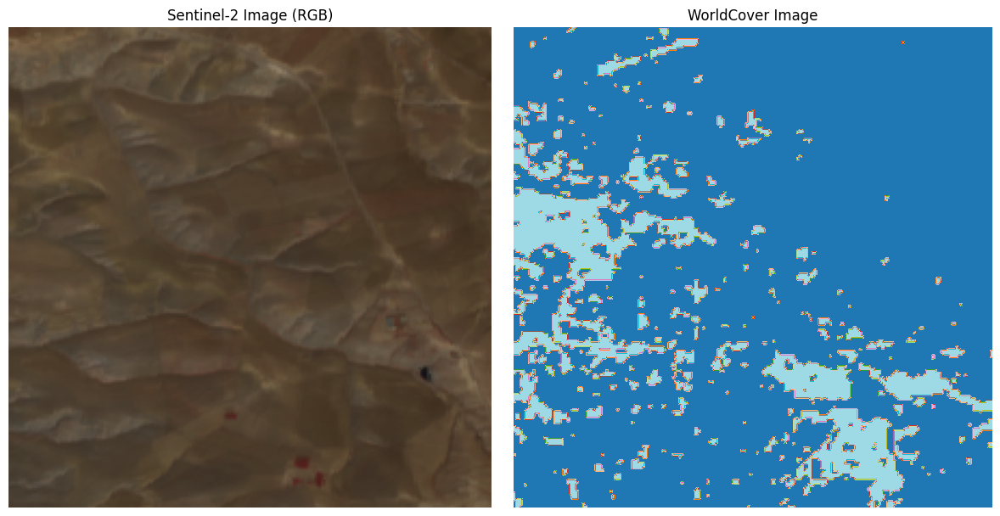

Image 2:


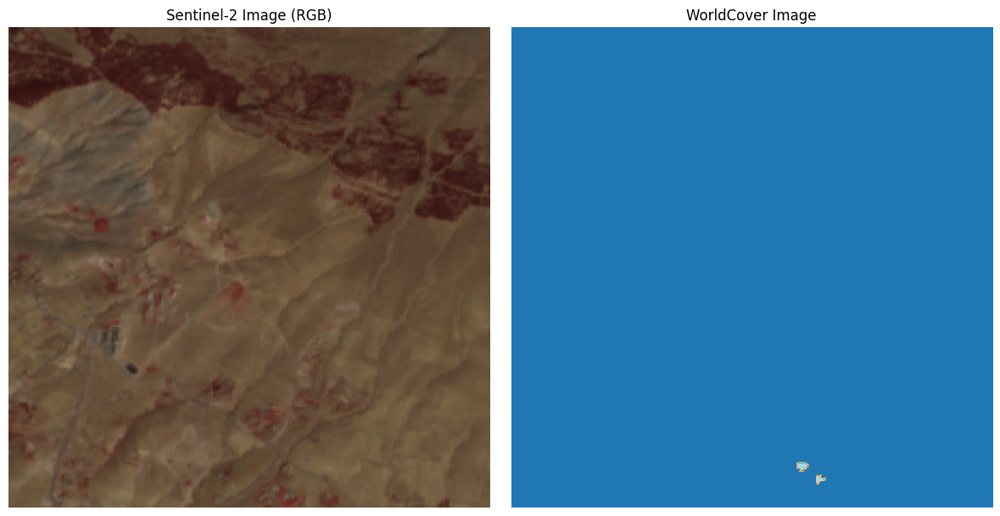

Image 3:


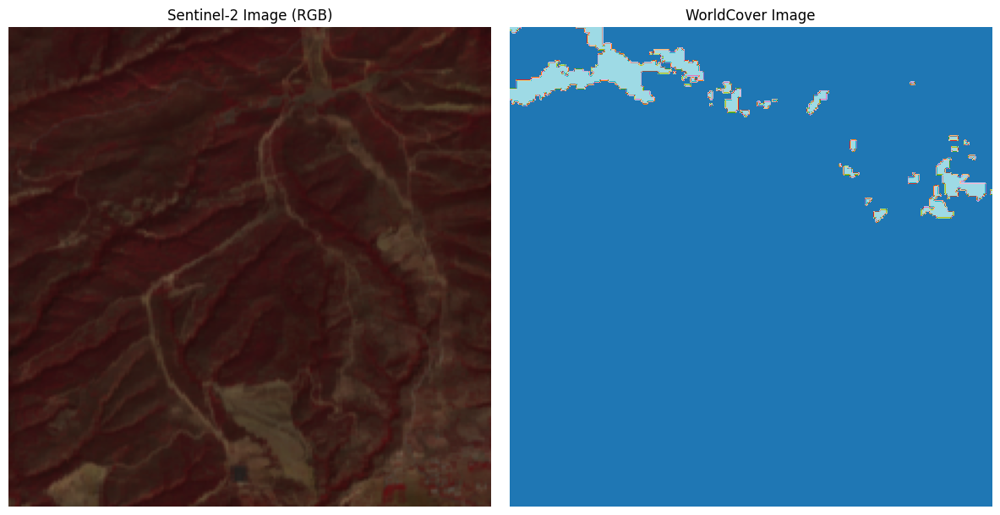

Image 4:


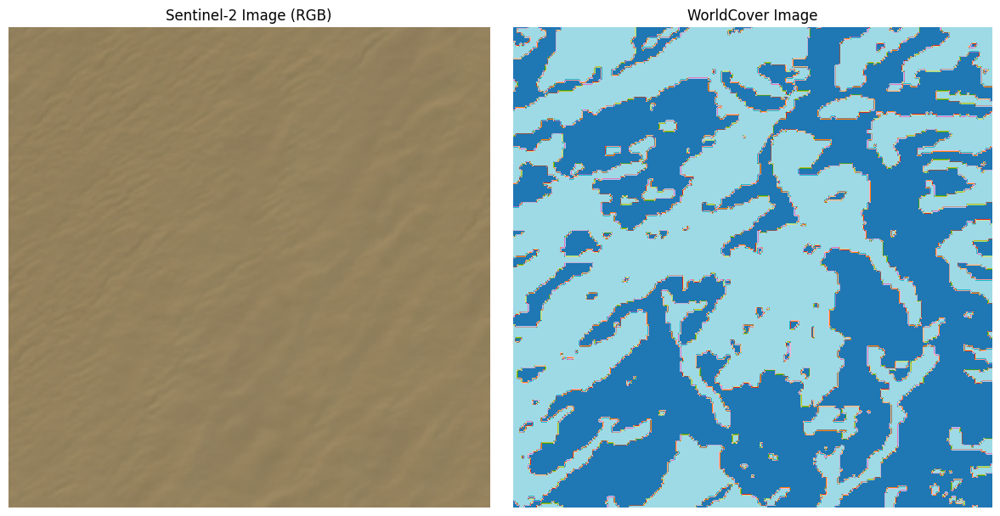

Image 5:


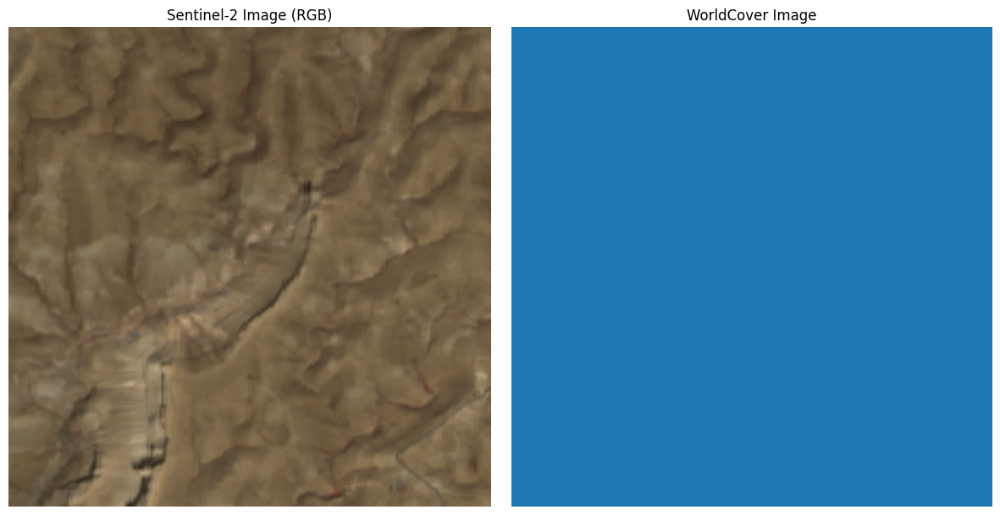

Image 6:


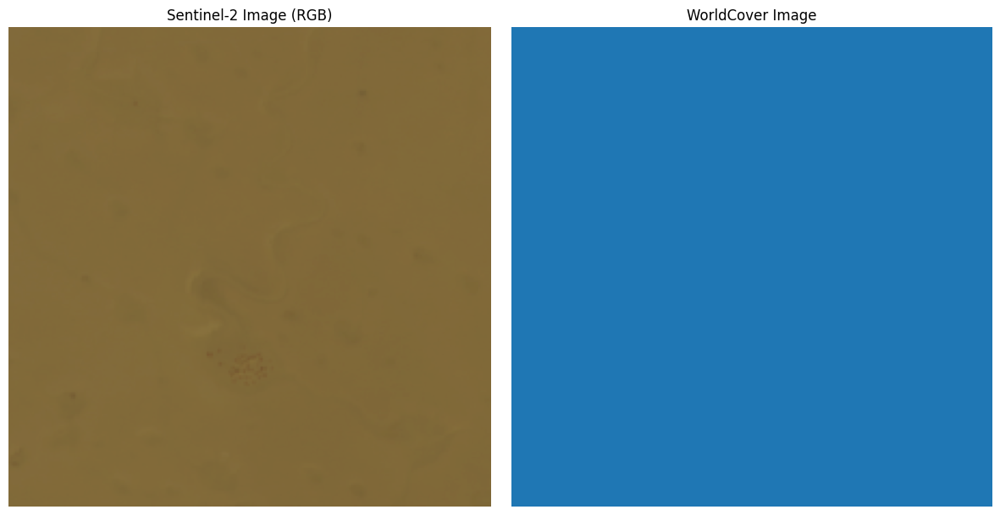

Image 7:


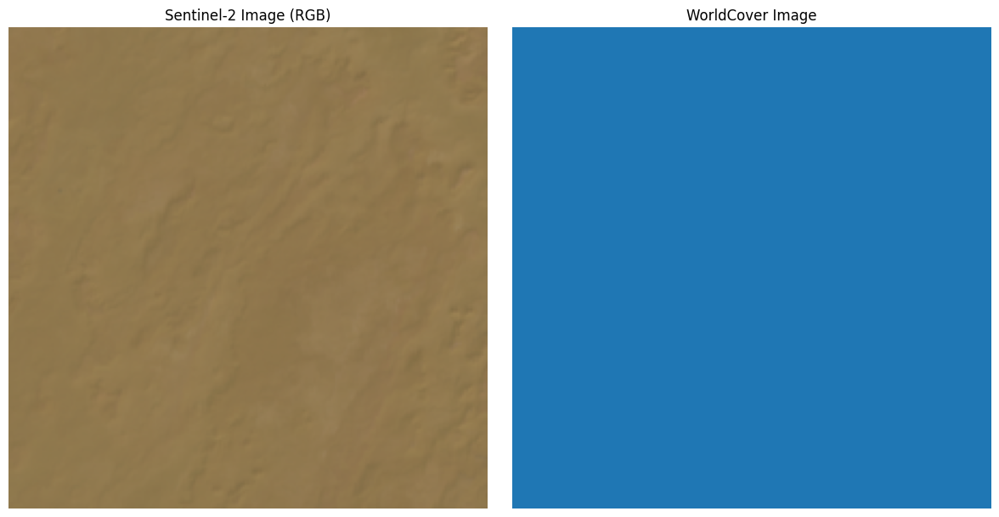

Image 8:


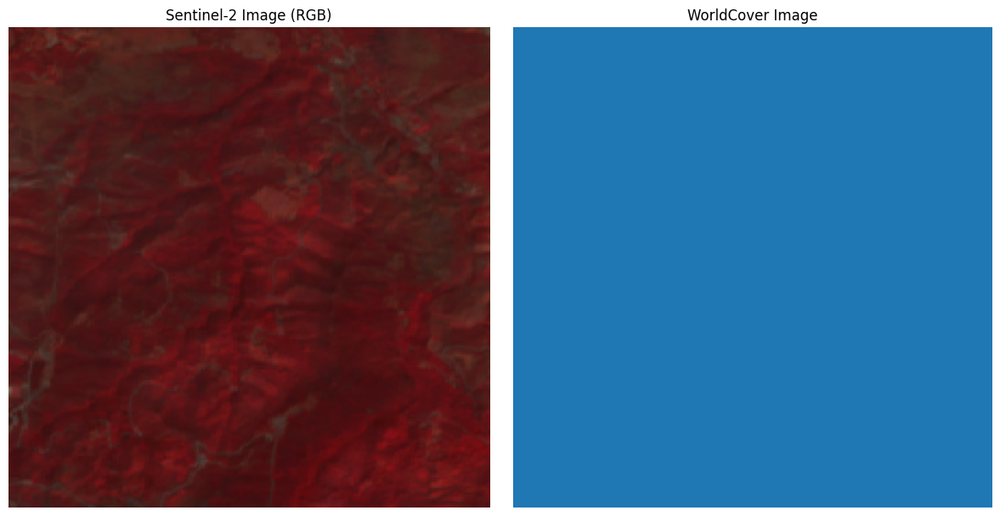

Image 9:


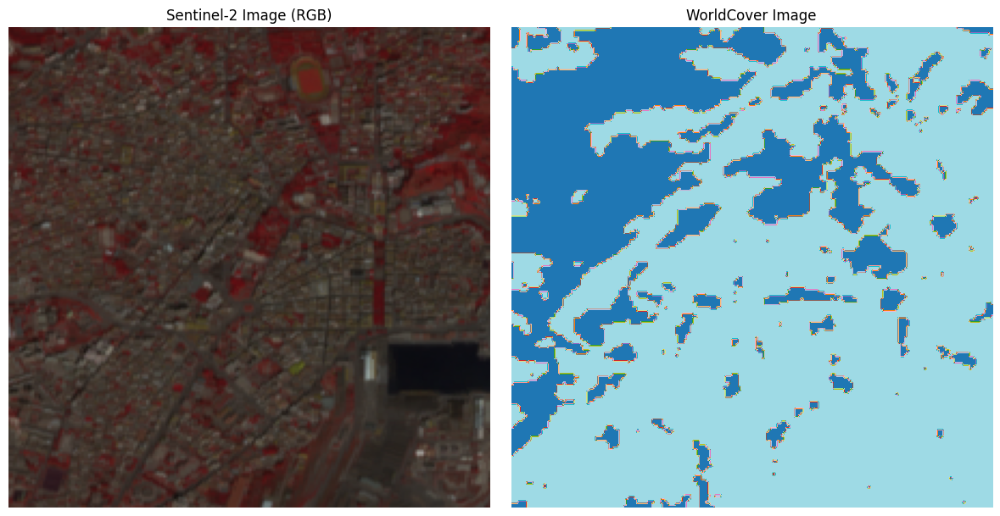

Image 10:


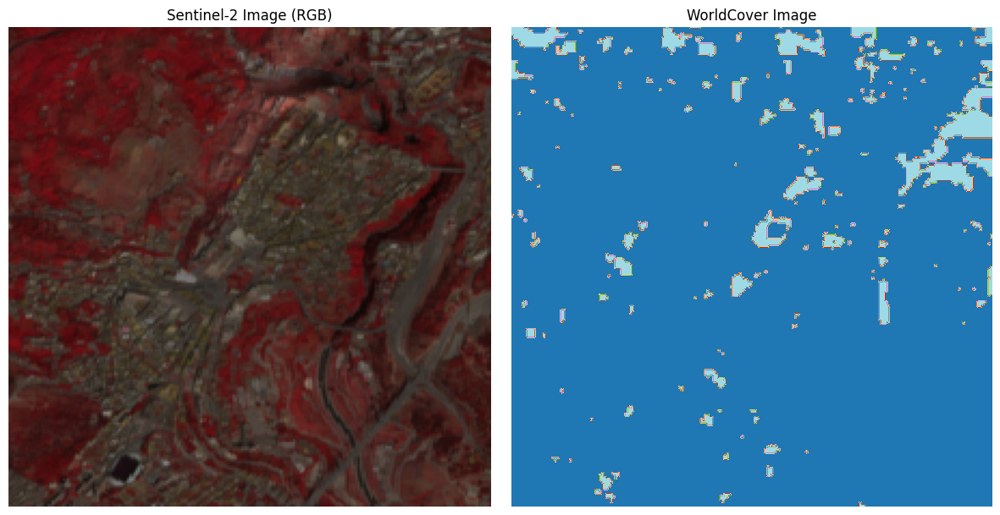

Image 11:


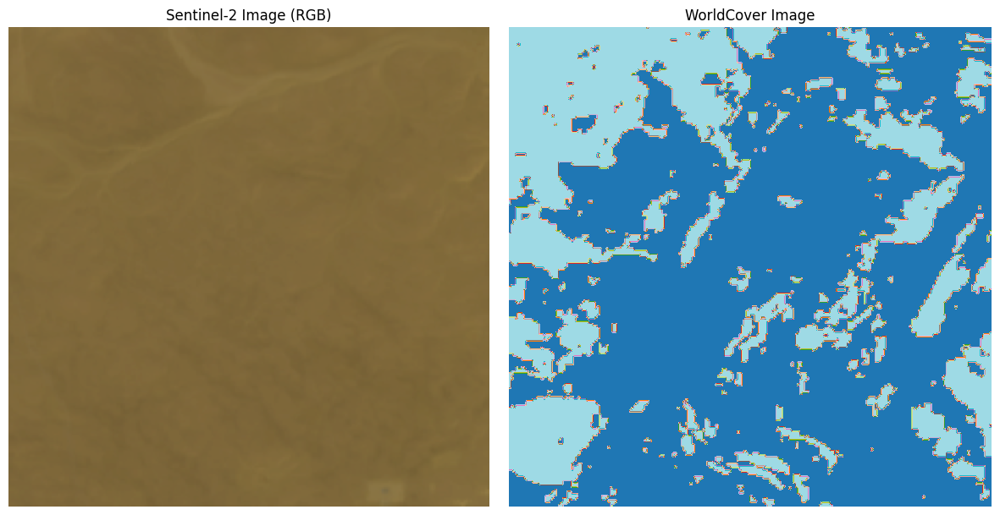

In [30]:

for i, (s2_file, wc_file) in enumerate(zip(sentinel2_files, worldcover_files)):
    print(f"Image {i + 1}:")
    visualize_images(s2_file, wc_file)
    if i == 10:
        break

In [31]:

# Load Sentinel-2 image
with rasterio.open(s2_file) as src:
    # Read all bands as a 3D array (bands, height, width)
    sentinel_image = src.read()  # Reads all bands
    sentinel_meta = src.meta  # Get metadata for reference

# Convert to 2D matrix if needed (for example, for the first band)
# You can choose any band you want; here, I'm selecting the first band as an example
first_band = sentinel_image[4]  # First band

# Print the shape and type of the image
print(f'Sentinel-2 Image shape: {sentinel_image.shape}')
print(f'First band shape: {first_band.shape}')

# Print min and max values of the first band
print(f'Min value (First Band): {np.min(first_band)}')
print(f'Max value (First Band): {np.max(first_band)}')

# Optional: Print the entire first band (be cautious with large images)
# print(first_band)


Sentinel-2 Image shape: (6, 223, 223)
First band shape: (223, 223)
Min value (First Band): 5839.538461538462
Max value (First Band): 6612.533333333334


# Data Preparation

In [32]:
import rasterio
import numpy as np
from skimage.transform import resize

def load_and_resize_images(s2_file, wc_file, size=(224, 224)):
    # Load Sentinel-2 image
    with rasterio.open(s2_file) as src:
        sentinel_image = src.read()  # Reads all bands
        sentinel_meta = src.meta

    # Load WorldCover image
    with rasterio.open(wc_file) as src:
        worldcover_image = src.read(1)  # Read the first band (classification labels)
        worldcover_meta = src.meta

    # Resize Sentinel-2 image (resize each band)
    resized_sentinel = np.stack([resize(sentinel_image[i], size, preserve_range=True) for i in range(sentinel_image.shape[0])])

    # Resize WorldCover image
    resized_worldcover = resize(worldcover_image, size, preserve_range=True, order=0).astype(worldcover_image.dtype)  # Use nearest neighbor interpolation for labels

    # Reshape Sentinel-2 image to (pixels, bands)
    X = resized_sentinel.reshape(-1, resized_sentinel.shape[0])

    # Reshape WorldCover labels to a 1D array
    y = resized_worldcover.flatten()

    return X, y

# Example usage to load, resize, and align the first 20 images
X_list = []
y_list = []

for s2_file, wc_file in zip(sentinel2_files[:20], worldcover_files[:20]):
    X, y = load_and_resize_images(s2_file, wc_file)
    X_list.append(X)
    y_list.append(y)

# Stack the features and labels
X = np.vstack(X_list)
y = np.hstack(y_list)

print(f"Resized Feature shape: {X.shape}, Resized Label shape: {y.shape}")


Resized Feature shape: (802816, 6), Resized Label shape: (802816,)


In [33]:
X[200]

array([1725.40260636, 1863.05466624, 1863.05466624, 1857.26964286,
       1731.27939827, 1712.2922619 ])

# Training

In [34]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Remove rows with NaN values from X and y
nan_mask = ~np.isnan(X).any(axis=1)  # Create a mask for rows without NaN values
X_clean = X[nan_mask]
y_clean = y[nan_mask]

X_train, X_test, y_train, y_test = train_test_split(X_clean, y_clean, test_size=0.2, random_state=42)

# Train the Random Forest classifier
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Evaluate the classifier on the test set
y_pred = clf.predict(X_test)

print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.87      0.99      0.93    138474
           1       0.52      0.08      0.14     22090

    accuracy                           0.86    160564
   macro avg       0.69      0.53      0.53    160564
weighted avg       0.82      0.86      0.82    160564



# Visual Evaluation

In [35]:
import matplotlib.pyplot as plt
import rasterio

# Function to predict on an image and reshape to original dimensions
def predict_image(s2_file, clf):
    with rasterio.open(s2_file) as src:
        sentinel_image = src.read()  # Load the Sentinel-2 image

    # Reshape the image for prediction
    X = sentinel_image.reshape(-1, sentinel_image.shape[0])

    # Predict land cover class
    y_pred = clf.predict(X)

    # Reshape back to original image dimensions
    prediction_image = y_pred.reshape(sentinel_image.shape[1], sentinel_image.shape[2])

    return sentinel_image, prediction_image




Visualizing image 1/16...


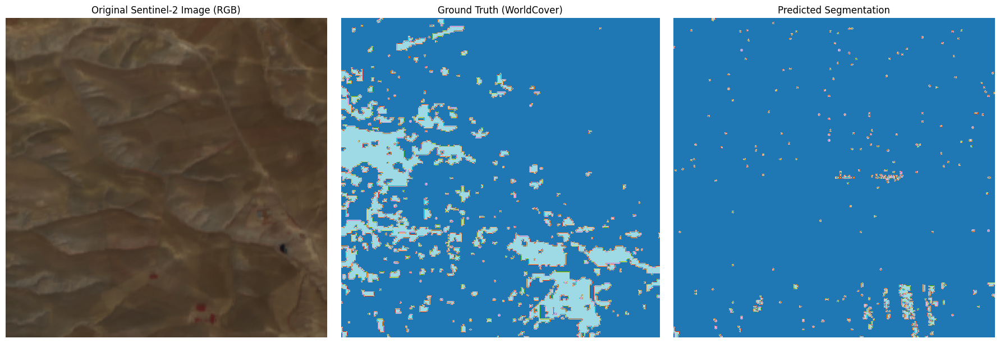

Visualizing image 2/16...


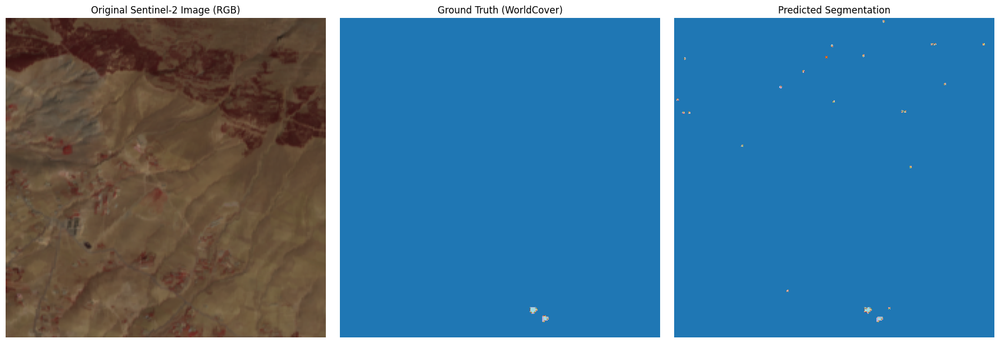

Visualizing image 3/16...


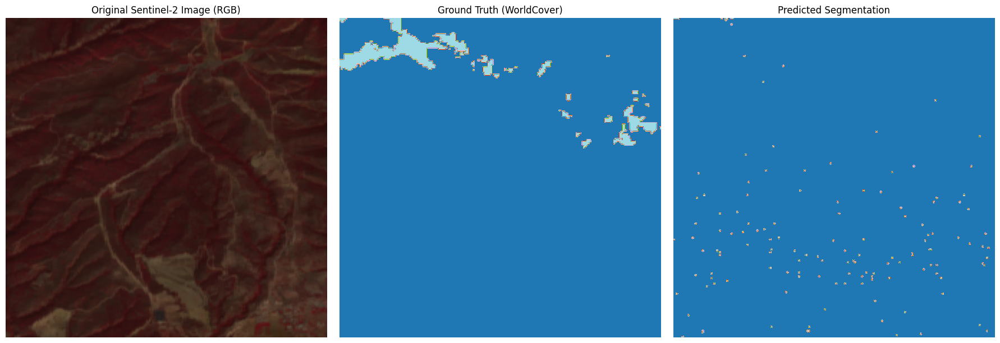

Visualizing image 4/16...


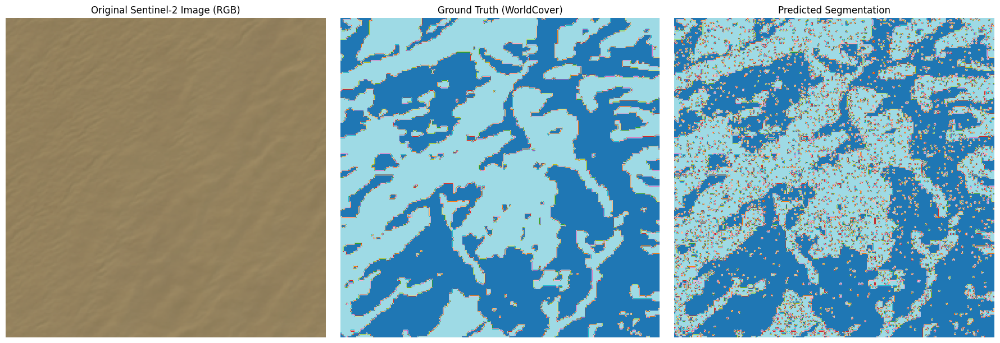

Visualizing image 5/16...


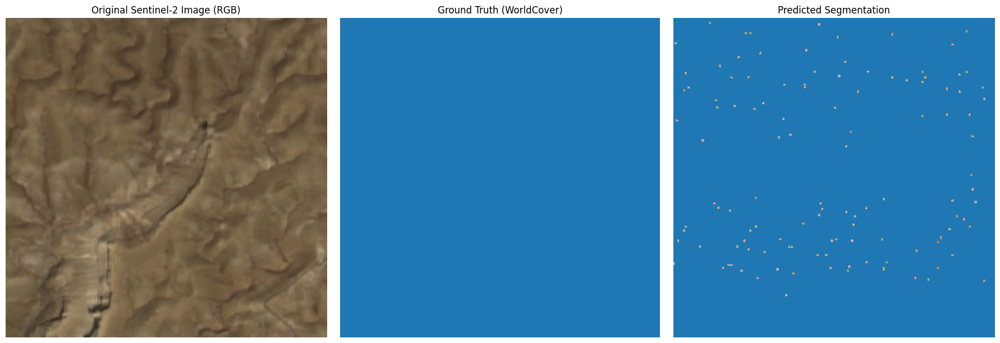

Visualizing image 6/16...


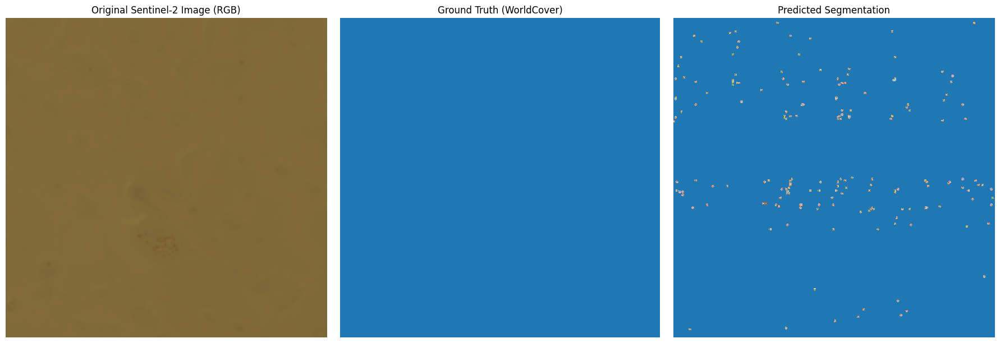

Visualizing image 7/16...


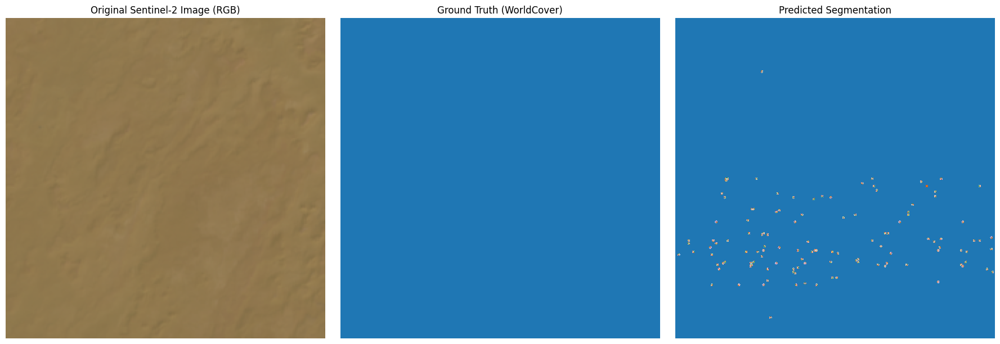

Visualizing image 8/16...


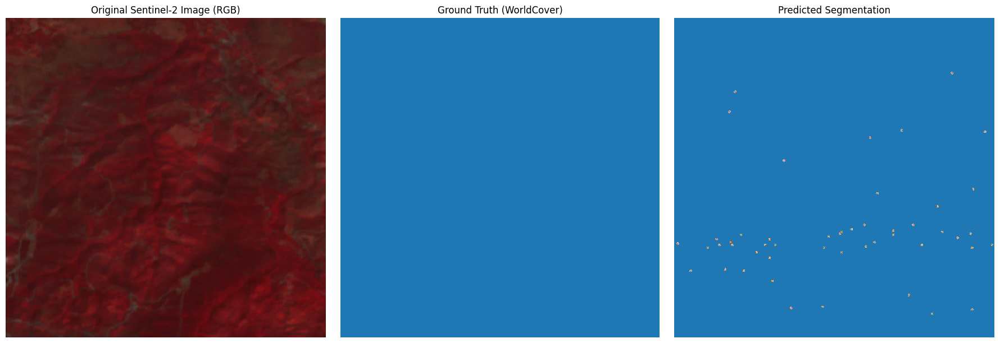

Visualizing image 9/16...


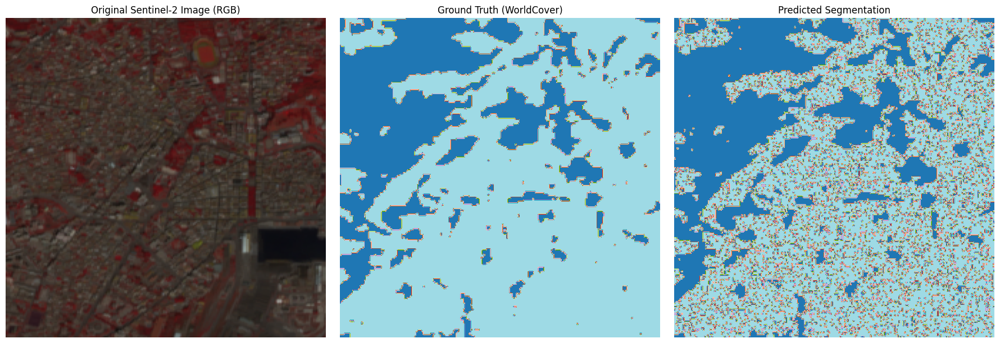

Visualizing image 10/16...


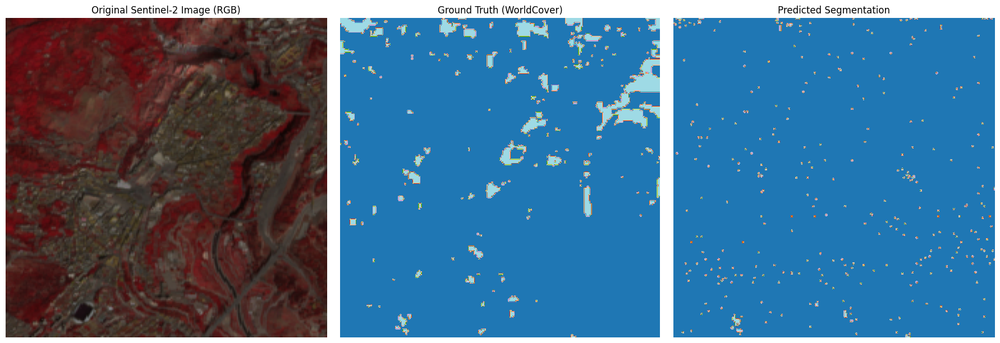

Visualizing image 11/16...


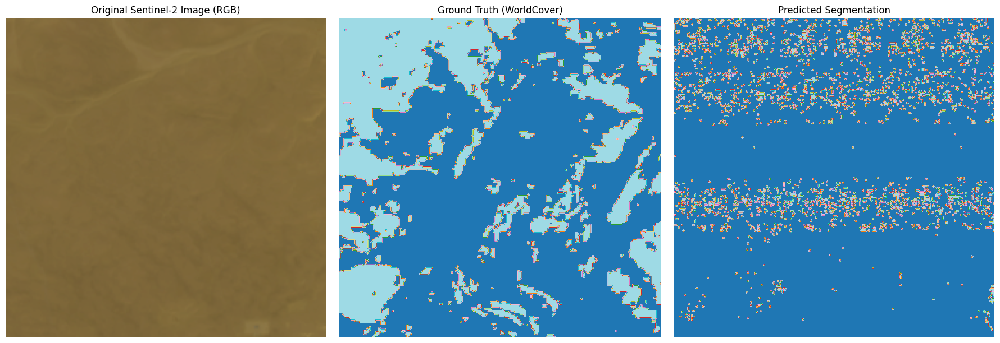

Visualizing image 12/16...


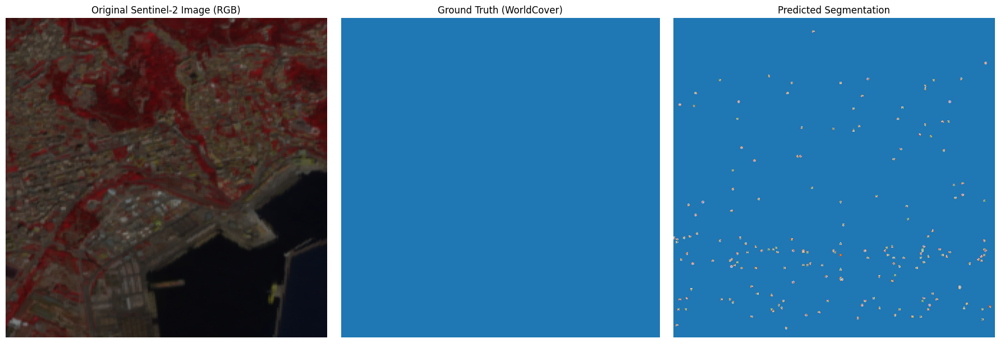

Visualizing image 13/16...


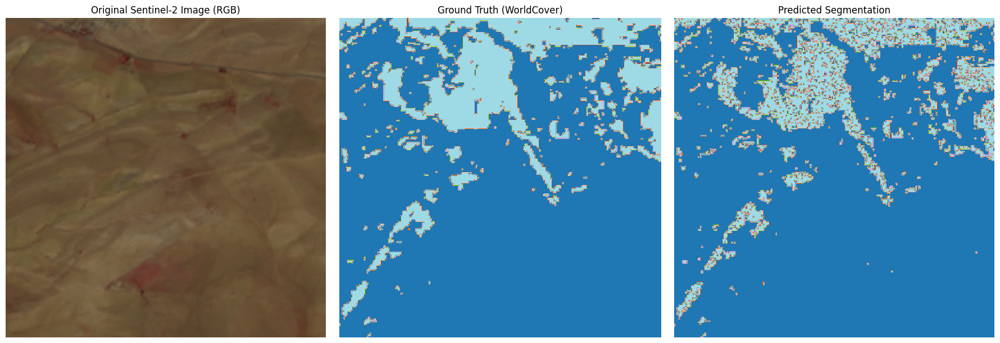

Visualizing image 14/16...


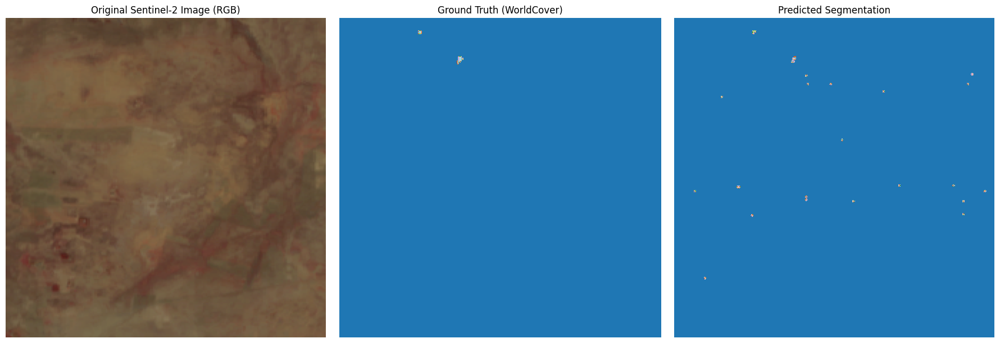

Visualizing image 15/16...


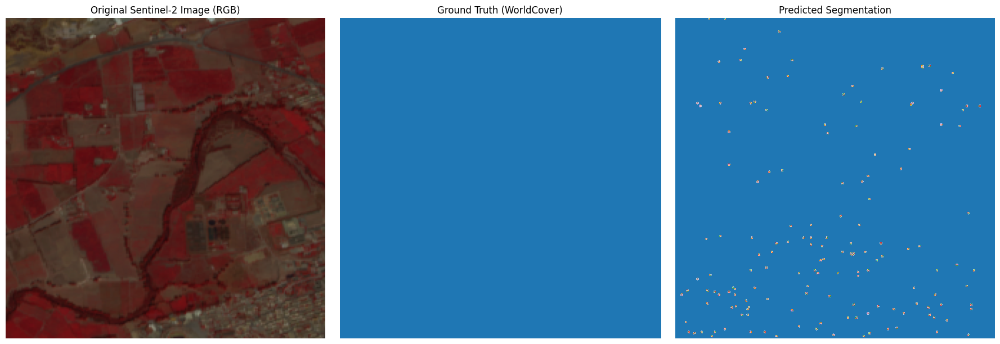

Visualizing image 16/16...


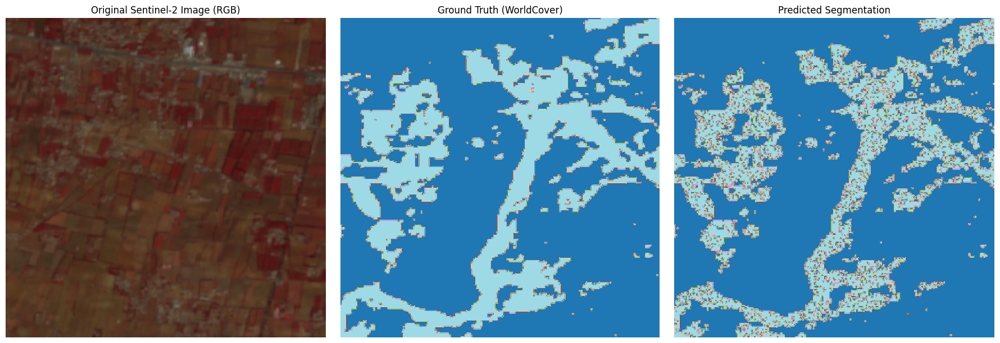

In [36]:
# Function to visualize original image, ground truth, and prediction
def visualize_original_label_prediction(s2_file, wc_file, clf):
    # Predict and get original Sentinel-2 image
    sentinel_image, segmentation_result = predict_image(s2_file, clf)

    # Load WorldCover image (Ground Truth Labels)
    with rasterio.open(wc_file) as src:
        worldcover_image = src.read(1)  # Load the ground truth labels

    # Visualize the original image (RGB), the ground truth, and the prediction
    plt.figure(figsize=(18, 6))

    # Plot Original Sentinel-2 Image (RGB)
    plt.subplot(1, 3, 1)
    plt.imshow(sentinel_image[[3, 2, 1]].transpose((1, 2, 0)) / 10000)  # Display Red, Green, Blue bands
    plt.title('Original Sentinel-2 Image (RGB)')
    plt.axis('off')

    # Plot Ground Truth (WorldCover Image)
    plt.subplot(1, 3, 2)
    plt.imshow(worldcover_image, cmap='tab20')  # Use a colormap to represent categories
    plt.title('Ground Truth (WorldCover)')
    plt.axis('off')

    # Plot Predicted Segmentation Result
    plt.subplot(1, 3, 3)
    plt.imshow(segmentation_result, cmap='tab20')  # Use a colormap for segmentation
    plt.title('Predicted Segmentation')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Loop through all Sentinel-2 and WorldCover images and visualize
for i in range(len(sentinel2_files)):
    print(f"Visualizing image {i+1}/{len(sentinel2_files)}...")
    visualize_original_label_prediction(s2_file=sentinel2_files[i], wc_file=worldcover_files[i], clf=clf)